## Metadata Exploration Insights

### 1. Species Taxonomy (taxonomy.csv)

In [2]:
import pandas as pd
metadata = pd.read_csv("data/taxonomy.csv")

In [3]:
metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206 entries, 0 to 205
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   primary_label    206 non-null    object
 1   inat_taxon_id    206 non-null    int64 
 2   scientific_name  206 non-null    object
 3   common_name      206 non-null    object
 4   class_name       206 non-null    object
dtypes: int64(1), object(4)
memory usage: 8.2+ KB


In [4]:
metadata.shape

(206, 5)

In [5]:
metadata.head()

,primary_label,inat_taxon_id,scientific_name,common_name,class_name
0,1139490,1139490,Ragoniella pulchella,Ragoniella pulchella,Insecta
1,1192948,1192948,Oxyprora surinamensis,Oxyprora surinamensis,Insecta
2,1194042,1194042,Copiphora colombiae,Copiphora colombiae,Insecta
3,126247,126247,Leptodactylus insularum,Spotted Foam-nest Frog,Amphibia
4,1346504,1346504,Neoconocephalus brachypterus,Neoconocephalus brachypterus,Insecta


In [6]:
metadata["class_name"].value_counts()

class_name
Aves        146
Amphibia     34
Insecta      17
Mammalia      9
Name: count, dtype: int64

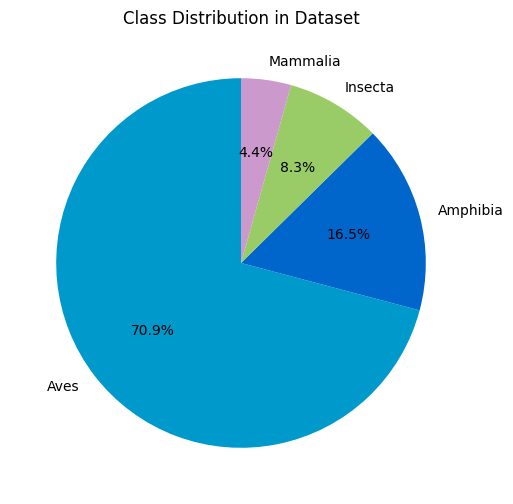

In [15]:
import matplotlib.pyplot as plt

class_counts = metadata['class_name'].value_counts()
colors = ['#0099cc', '#0066cc', '#99cc66', '#cc99cc']

plt.figure(figsize=(6,6))
plt.pie(
    class_counts, 
    labels=class_counts.index,        # class names as labels
    autopct='%1.1f%%',                # show percentages like 70.8%
    startangle=90,                     # rotate for better layout
    colors=colors,                     # custom colors
)
plt.title("Class Distribution in Dataset")
plt.show()



In [8]:
diffs = metadata[metadata["primary_label"].astype(str) != metadata["inat_taxon_id"].astype(str)]
diffs['class_name'].value_counts()

class_name
Aves    146
Name: count, dtype: int64

In [9]:
diffs_name = metadata[metadata["scientific_name"].astype(str) != metadata["common_name"].astype(str)]
diffs_name["class_name"].value_counts()

class_name
Aves        146
Amphibia     34
Mammalia      9
Insecta       3
Name: count, dtype: int64

**Key Findings**

- Total entries in metadata: 206 species
- Metadata contains 5 main columns:
  - `primary_label` – unique identifier used in prediction
  - `inat_taxon_id` – iNaturalist reference ID
  - `scientific_name` – Latin binomial species name
  - `common_name` – human-friendly name
  - `class_name` – biological class

Class Distribution:
- Aves (Birds): 146 species
- Amphibia (Amphibians): 34 species
- Insecta (Insects): 17 species
- Mammalia (Mammals): 9 species

Label Consistency Check:
- `primary_label` and `inat_taxon_id` are visually similar
- After converting to `str`, found mismatches for all 146 Aves entries
- This inconsistency only affects Bird species

Naming Check:
- In 14 species, `scientific_name` and `common_name` are identical
- All 14 of these cases belong to the Insecta class



### 2. Training Sample Metadata (train.csv)

In [10]:
train_metadata = pd.read_csv("data/train.csv")
train_metadata

,primary_label,secondary_labels,type,filename,collection,rating,url,latitude,longitude,scientific_name,common_name,author,license
0,1139490,[''],[''],1139490/CSA36385.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3206,-73.7128,Ragoniella pulchella,Ragoniella pulchella,Fabio A. Sarria-S,cc-by-nc-sa 4.0
1,1139490,[''],[''],1139490/CSA36389.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3206,-73.7128,Ragoniella pulchella,Ragoniella pulchella,Fabio A. Sarria-S,cc-by-nc-sa 4.0
2,1192948,[''],[''],1192948/CSA36358.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3791,-73.7313,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0
3,1192948,[''],[''],1192948/CSA36366.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.2800,-73.8582,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0
4,1192948,[''],[''],1192948/CSA36373.ogg,CSA,0.0,http://colecciones.humboldt.org.co/rec/sonidos...,7.3791,-73.7313,Oxyprora surinamensis,Oxyprora surinamensis,Fabio A. Sarria-S,cc-by-nc-sa 4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
28559,ywcpar,[''],[''],ywcpar/iNat77392.ogg,iNat,0.0,https://static.inaturalist.org/sounds/77392.m4a,7.6921,-80.3379,Amazona ochrocephala,Yellow-crowned Parrot,Yennifer Alfaro,cc-by-nc 4.0
28560,ywcpar,[''],[''],ywcpar/iNat78624.ogg,iNat,0.0,https://static.inaturalist.org/sounds/78624.wav,8.9918,-79.4877,Amazona ochrocephala,Yellow-crowned Parrot,Evan Centanni,cc-by-nc-sa 4.0
28561,ywcpar,[''],[''],ywcpar/iNat789234.ogg,iNat,0.0,https://static.inaturalist.org/sounds/789234.wav,9.2316,-70.2041,Amazona ochrocephala,Yellow-crowned Parrot,Henrry,cc-by 4.0
28562,ywcpar,[''],[''],ywcpar/iNat819873.ogg,iNat,0.0,https://static.inaturalist.org/sounds/819873.mp3,10.5838,-66.8545,Amazona ochrocephala,Yellow-crowned Parrot,Alejandro Luy,cc-by-nc 4.0


In [11]:
train_metadata["primary_label"].value_counts()

primary_label
grekis     990
compau     808
trokin     787
roahaw     709
banana     610
          ... 
476537       2
47067        2
42113        2
42087        2
1139490      2
Name: count, Length: 206, dtype: int64

In [12]:
merged_data = train_metadata.merge(metadata[['primary_label', 'class_name']], on = 'primary_label', how='left')
merged_data.head

<bound method NDFrame.head of       primary_label secondary_labels  type               filename collection  \
0           1139490             ['']  ['']   1139490/CSA36385.ogg        CSA   
1           1139490             ['']  ['']   1139490/CSA36389.ogg        CSA   
2           1192948             ['']  ['']   1192948/CSA36358.ogg        CSA   
3           1192948             ['']  ['']   1192948/CSA36366.ogg        CSA   
4           1192948             ['']  ['']   1192948/CSA36373.ogg        CSA   
...             ...              ...   ...                    ...        ...   
28559        ywcpar             ['']  ['']   ywcpar/iNat77392.ogg       iNat   
28560        ywcpar             ['']  ['']   ywcpar/iNat78624.ogg       iNat   
28561        ywcpar             ['']  ['']  ywcpar/iNat789234.ogg       iNat   
28562        ywcpar             ['']  ['']  ywcpar/iNat819873.ogg       iNat   
28563        ywcpar             ['']  ['']  ywcpar/iNat922688.ogg       iNat   

       ra

In [13]:
import folium

map_center = [merged_data['latitude'].mean(), merged_data['longitude'].mean()]

class_color = {
    'Aves': 'blue',
    'Amphibia': 'black',
    'Insecta': 'orange',
    'Mammalia': 'red'    
}
m = folium.Map(location=map_center, zoom_start=3)
for idx, row in merged_data.iterrows():
    if not pd.isnull(row['latitude']) and not pd.isnull(row['longitude']):
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=2,
            color=class_color.get(row['class_name'], 'gray'),  
            fill=True,
            fill_color=class_color.get(row['class_name'], 'gray'),  
            fill_opacity=0.5
        ).add_to(m)

m


**Key Findings: Geographic Distribution of Recordings**

- The majority of recording locations are concentrated in the Americas, especially in the Amazon and Central America.
- Notable recording activity also exists in parts of Europe, Africa, and Southeast Asia.
- Very sparse recordings are found in deserts, polar regions, and remote continents like Antarctica.
- Classifiers may struggle badly for African or Asian species due to lack of samples.
